<a href="https://colab.research.google.com/github/alenready/ML_AI_ICT-Assignments/blob/main/ThetaBot_Prj__Food_101.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
# run kaggle.json

import json
import os

# Assuming kaggle.json is in your Google Drive, replace with the actual path
kaggle_json_path = "/content/kaggle.json"

# Check if the file exists
if os.path.exists(kaggle_json_path):
    try:
        with open(kaggle_json_path, 'r') as f:
            kaggle_data = json.load(f)

        # Set Kaggle environment variables
        os.environ['KAGGLE_USERNAME'] = kaggle_data['username']
        os.environ['KAGGLE_KEY'] = kaggle_data['key']

        print("Kaggle credentials loaded successfully.")
    except (FileNotFoundError, json.JSONDecodeError, KeyError) as e:
        print(f"Error loading Kaggle credentials: {e}")
else:
    print(f"Error: kaggle.json not found at {kaggle_json_path}")


Error: kaggle.json not found at /content/kaggle.json


In [ ]:
!pip install kaggle


In [ ]:
!kaggle datasets download -d dansbecker/food-101


Dataset URL: https://www.kaggle.com/datasets/dansbecker/food-101
License(s): other
100% 9.37G/9.38G [01:48<00:00, 180MB/s]
100% 9.38G/9.38G [01:48<00:00, 92.6MB/s]


In [ ]:
from google.colab import files
files.upload()  # Upload the kaggle.json file


Saving kaggle.json to kaggle.json


{'kaggle.json': b'{"username":"alenreadygmailcom","key":"41cc7c770435fe7eafa52cc453a64cae"}'}

In [ ]:
!kaggle datasets download -d dansbecker/food-101
!unzip -q /content/food-101.zip -d /content/food-101

Dataset URL: https://www.kaggle.com/datasets/dansbecker/food-101
License(s): other
100% 9.36G/9.38G [00:57<00:00, 262MB/s]
100% 9.38G/9.38G [00:57<00:00, 174MB/s]


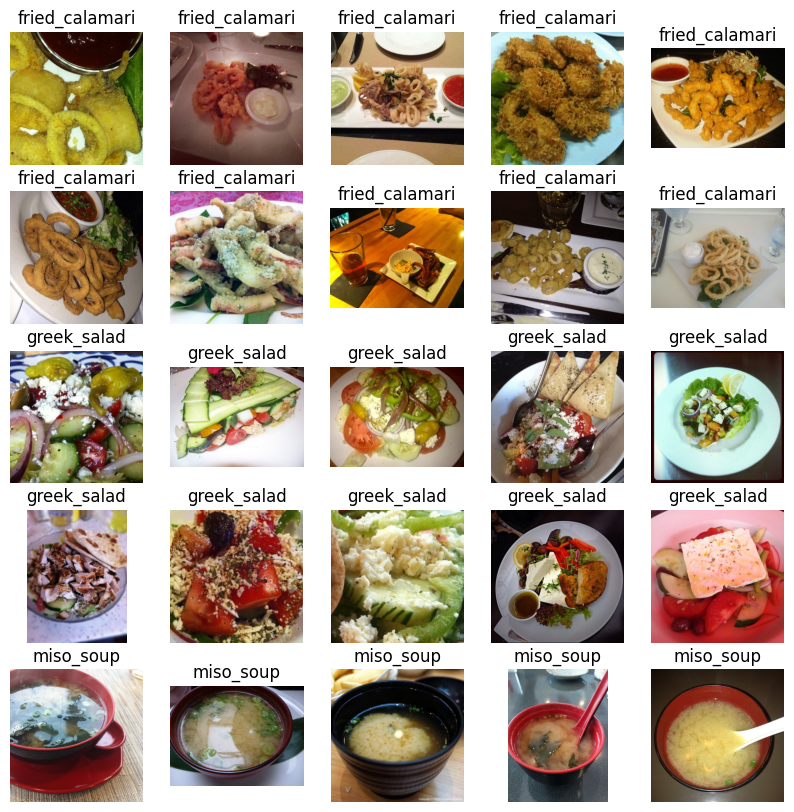

In [ ]:
  import os
  import random
  from PIL import Image
  import matplotlib.pyplot as plt

  # Define the path to images
  data_dir = '/content/food-101/food-101/food-101/images'

  # Get a list of all classes
  classes = os.listdir(data_dir)

  # Initialize lists to hold image paths and labels
  image_paths = []
  labels = []

  # Number of images per class to load
  images_per_class = 10  # Adjust this number as needed

  for cls in classes:
      cls_dir = os.path.join(data_dir, cls)
      if os.path.isdir(cls_dir):
          # Get all image files in the class directory
          all_images = os.listdir(cls_dir)
          # Randomly select a subset of images
          selected_images = random.sample(all_images, images_per_class)
          for img in selected_images:
              image_paths.append(os.path.join(cls_dir, img))
              labels.append(cls)

  # Display some sample images
  plt.figure(figsize=(10, 10))
  for i in range(25):  # Displaying 25 images
      plt.subplot(5, 5, i + 1)
      img = Image.open(image_paths[i])
      plt.imshow(img)
      plt.title(labels[i])
      plt.axis('off')
  plt.show()


5. Creating a DataFrame for the Subset:

Organize the subset into a DataFrame for easier manipulation.

In [ ]:
  import pandas as pd

  # Create a DataFrame
  df = pd.DataFrame({
      'image_path': image_paths,
      'label': labels
  })

  # Display the first few rows
  print(df.head())


                                          image_path           label
0  /content/food-101/food-101/food-101/images/fri...  fried_calamari
1  /content/food-101/food-101/food-101/images/fri...  fried_calamari
2  /content/food-101/food-101/food-101/images/fri...  fried_calamari
3  /content/food-101/food-101/food-101/images/fri...  fried_calamari
4  /content/food-101/food-101/food-101/images/fri...  fried_calamari


6. Saving the Subset for Future Use:

Save the DataFrame to a CSV file and the images to a directory in your Google Drive.

In [ ]:
  # Define the path to save the subset
  subset_dir = '/content/drive/MyDrive/food-101-subset/'

  # Create the directory if it doesn't exist
  os.makedirs(subset_dir, exist_ok=True)

  # Save images
  for i, row in df.iterrows():
      img = Image.open(row['image_path'])
      # Define the path to save the image
      save_path = os.path.join(subset_dir, os.path.basename(row['image_path']))
      img.save(save_path)

  # Save the DataFrame to a CSV file
  df.to_csv(os.path.join(subset_dir, 'subset_labels.csv'), index=False)


In [ ]:
df.shape

(1010, 2)

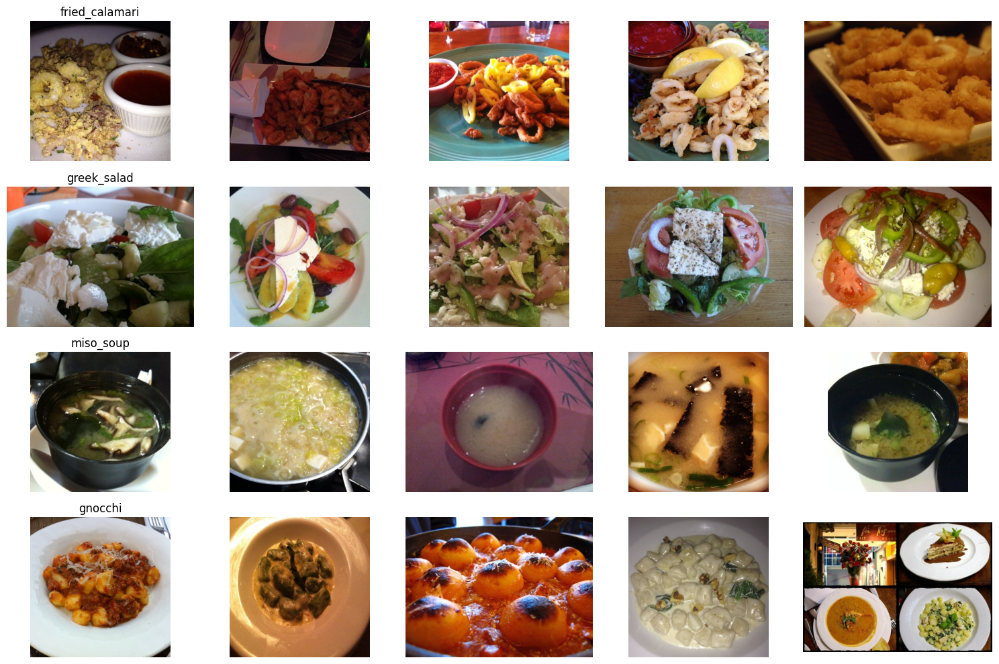

In [ ]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from PIL import Image

# Define dataset directory
dataset_dir = "/content/food-101/food-101/food-101/images"

# Load a few sample images, excluding .DS_Store
sample_classes = [
    f for f in os.listdir(dataset_dir)[:5] if os.path.isdir(os.path.join(dataset_dir, f))
]  # Pick 5 random food categories and exclude .DS_Store if present

# Display some sample images
fig, axes = plt.subplots(len(sample_classes), 5, figsize=(15, 10))

for i, food_class in enumerate(sample_classes):
    class_dir = os.path.join(dataset_dir, food_class)
    image_files = os.listdir(class_dir)[:5]  # Pick 5 images per class

    for j, image_file in enumerate(image_files):
        img_path = os.path.join(class_dir, image_file)
        img = Image.open(img_path)
        axes[i, j].imshow(img)
        axes[i, j].axis("off")
        if j == 0:
            axes[i, j].set_title(food_class, fontsize=12)

plt.tight_layout()
plt.show()

Loads 5 food categories and 5 images from each.
Displays them in a grid layout for quick inspection.


##2. Check Image Sizes and Aspect Ratios
Understanding image size distribution helps in preprocessing.


Collects image sizes (width, height).
Computes aspect ratios (important for resizing images).
Plots a histogram to visualize distribution.

             Width       Height
count  2000.000000  2000.000000
mean    497.404000   474.039000
std      43.573353    65.963521
min     287.000000   287.000000
25%     512.000000   384.000000
50%     512.000000   512.000000
75%     512.000000   512.000000
max     512.000000   512.000000


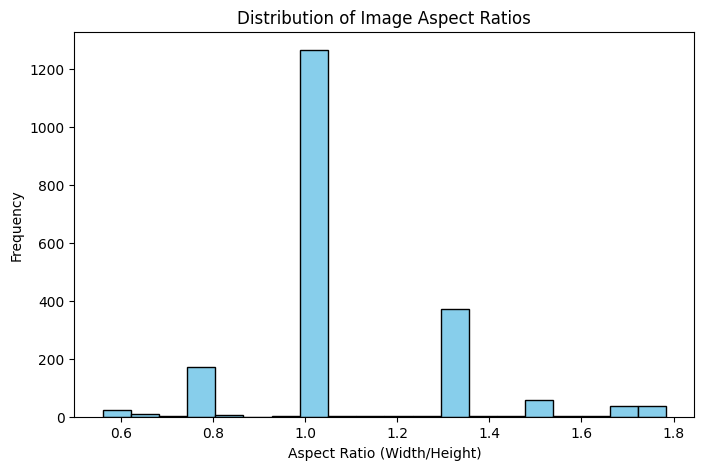

In [ ]:
image_sizes = []
aspect_ratios = []

# Scan the first 500 images for analysis
for food_class in sample_classes:
    class_dir = os.path.join(dataset_dir, food_class)
    image_files = os.listdir(class_dir)[:500]  # Limit for speed

    for image_file in image_files:
        img_path = os.path.join(class_dir, image_file)
        img = Image.open(img_path)

        width, height = img.size
        image_sizes.append((width, height))
        aspect_ratios.append(width / height)

# Convert to DataFrame for better analysis
df_sizes = pd.DataFrame(image_sizes, columns=["Width", "Height"])
print(df_sizes.describe())  # Summary statistics

# Plot aspect ratio distribution
plt.figure(figsize=(8, 5))
plt.hist(aspect_ratios, bins=20, color="skyblue", edgecolor="black")
plt.xlabel("Aspect Ratio (Width/Height)")
plt.ylabel("Frequency")
plt.title("Distribution of Image Aspect Ratios")
plt.show()


##3. Color Distribution & Channel Analysis
Helps in understanding brightness, contrast, and color properties.

Extracts RGB values from a random image.
Plots histograms of red, green, and blue channel distributions.
Helps understand brightness, contrast, and color properties.

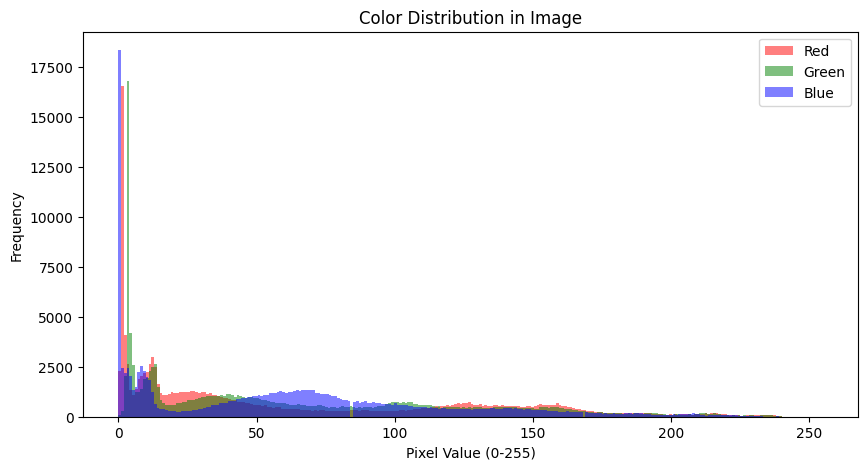

In [ ]:
def plot_color_distribution(img_path):
    img = Image.open(img_path)
    img_array = np.array(img)

    # Extract color channels
    red_vals = img_array[:, :, 0].flatten()
    green_vals = img_array[:, :, 1].flatten()
    blue_vals = img_array[:, :, 2].flatten()

    # Plot histograms
    plt.figure(figsize=(10, 5))
    plt.hist(red_vals, bins=256, color="red", alpha=0.5, label="Red")
    plt.hist(green_vals, bins=256, color="green", alpha=0.5, label="Green")
    plt.hist(blue_vals, bins=256, color="blue", alpha=0.5, label="Blue")
    plt.xlabel("Pixel Value (0-255)")
    plt.ylabel("Frequency")
    plt.title("Color Distribution in Image")
    plt.legend()
    plt.show()

# Pick a random image from dataset and analyze color distribution
random_class = np.random.choice(sample_classes)
random_image = np.random.choice(os.listdir(os.path.join(dataset_dir, random_class)))
image_path = os.path.join(dataset_dir, random_class, random_image)

plot_color_distribution(image_path)


##4. Convert Images to Grayscale for Edge Detection
Grayscale images are useful for edge detection and texture analysis.

Converts an image to grayscale.
Applies edge detection to highlight contours.
Helps in texture-based food recognition.

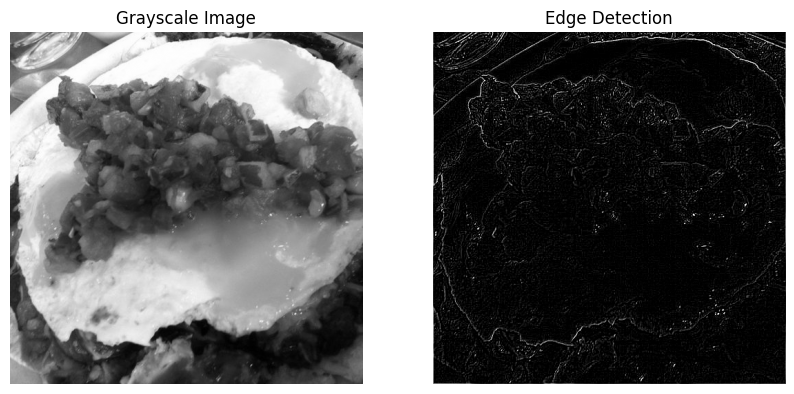

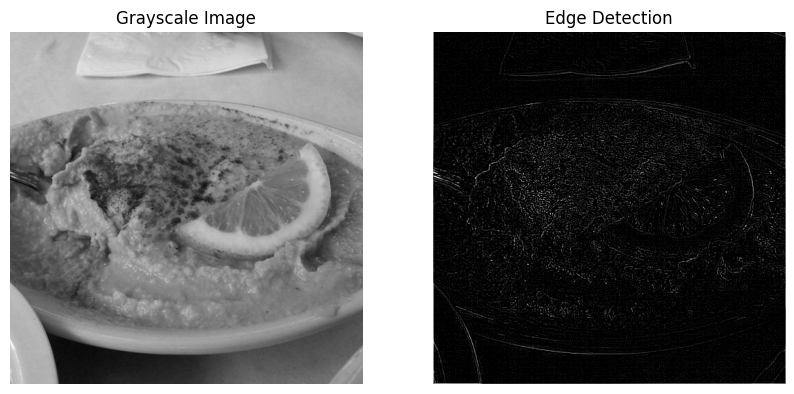

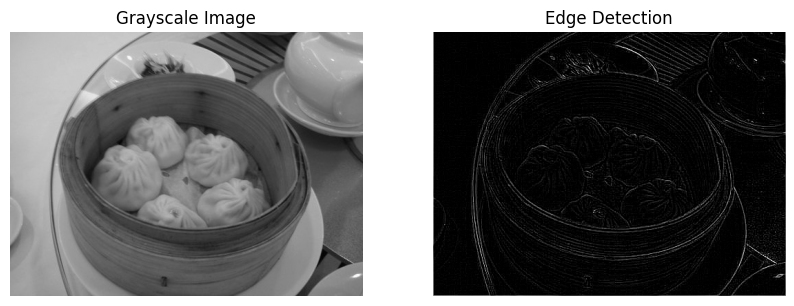

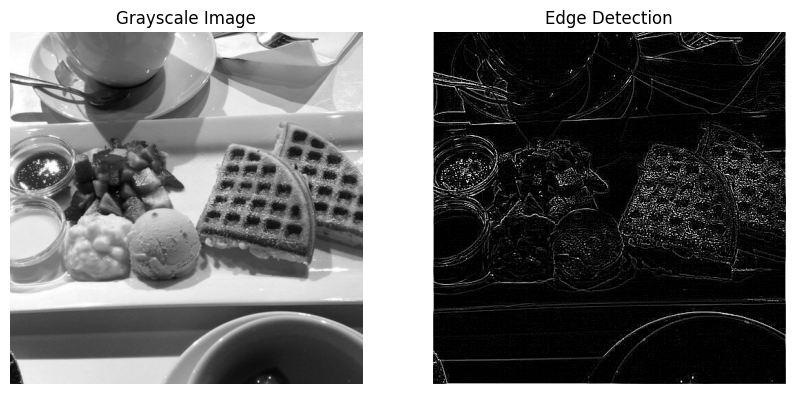

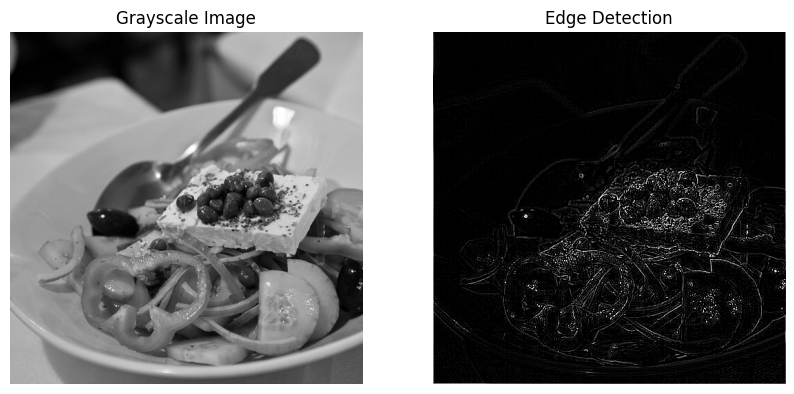

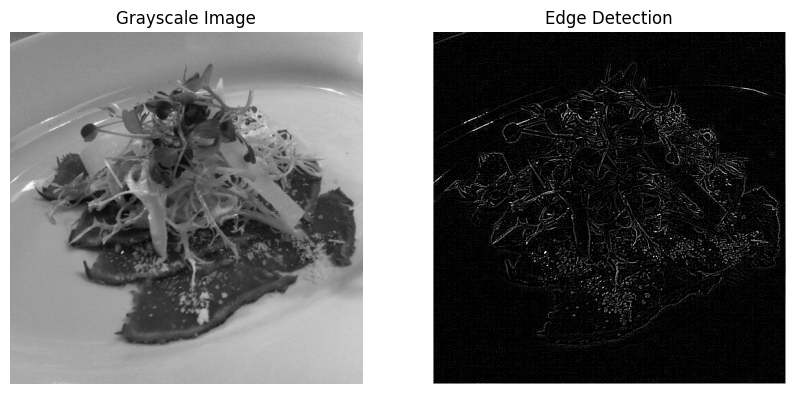

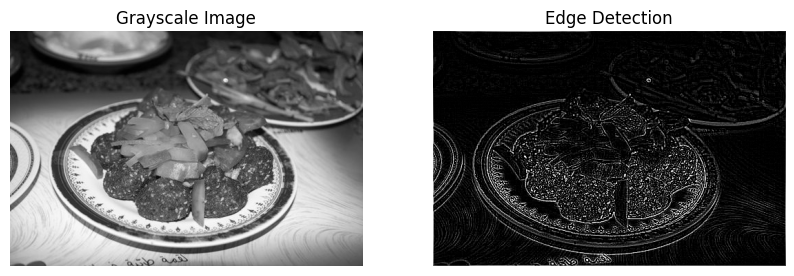

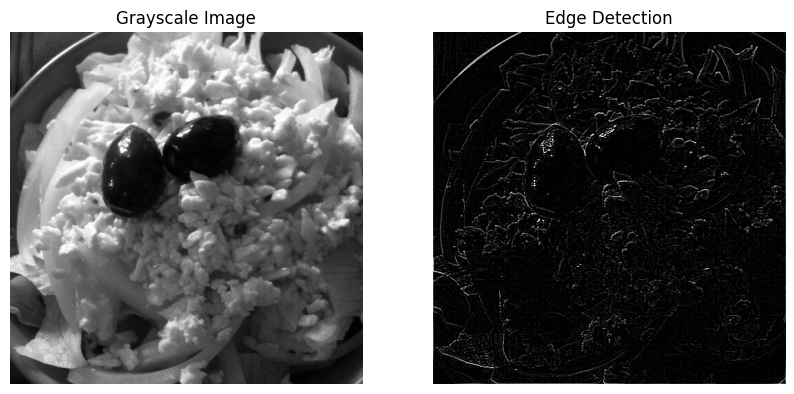

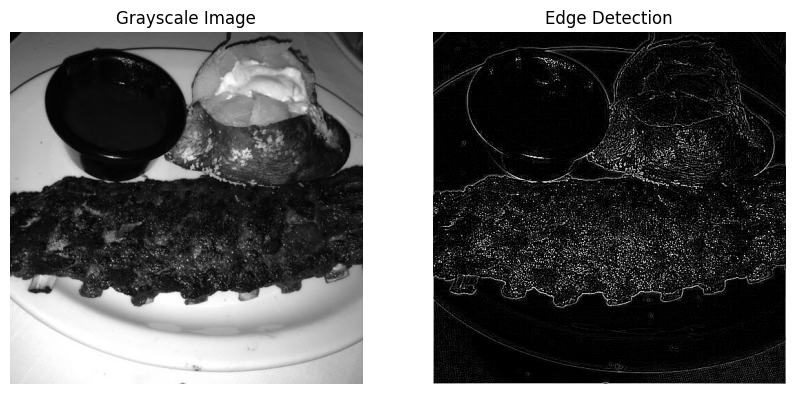

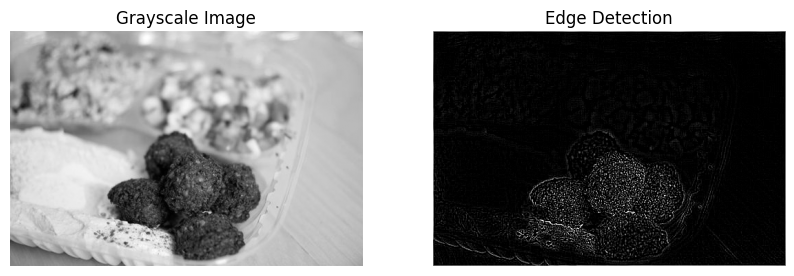

In [ ]:
from PIL import Image, ImageFilter # Import ImageFilter


def show_grayscale_and_edges(img_path):
    img = Image.open(img_path).convert("L")  # Convert to grayscale
    edges = img.filter(ImageFilter.FIND_EDGES)  # Edge detection using ImageFilter

    # Show original grayscale and edge-detected images
    fig, ax = plt.subplots(1, 2, figsize=(10, 5))
    ax[0].imshow(img, cmap="gray")
    ax[0].set_title("Grayscale Image")
    ax[0].axis("off")

    ax[1].imshow(edges, cmap="gray")
    ax[1].set_title("Edge Detection")
    ax[1].axis("off")

    plt.show()

# Run on a sample image
#show_grayscale_and_edges(image_path)
num_random_images = 10  # You can change this number
for _ in range(num_random_images):
    random_class = random.choice(os.listdir(dataset_dir))
    class_dir = os.path.join(dataset_dir, random_class)

    if os.path.isdir(class_dir):  # Check if it's a directory (important!)
        random_image = random.choice(os.listdir(class_dir))
        image_path = os.path.join(class_dir, random_image)

        try:
            show_grayscale_and_edges(image_path)
        except Exception as e:
            print(f"Error processing image {image_path}: {e}")


##5. Generate Image Statistics Summary
View an overview of dataset characteristics.
python
Copy
Edit


In [ ]:
def dataset_summary():
    total_classes = len(os.listdir(dataset_dir))
    total_images = sum([len(files) for _, _, files in os.walk(dataset_dir)])

    print(f"Total Food Categories: {total_classes}")
    print(f"Total Images: {total_images}")

    # Show sample class names
    print("Sample Food Categories:", sample_classes)

dataset_summary()


Total Food Categories: 102
Total Images: 101001
Sample Food Categories: ['fried_calamari', 'greek_salad', 'miso_soup', 'gnocchi']


In [ ]:
# Count the occurrences of each label (food category)
label_counts = df['label'].value_counts()
print(label_counts)

label
fried_calamari       10
chicken_wings        10
hot_and_sour_soup    10
fried_rice           10
takoyaki             10
                     ..
dumplings            10
pizza                10
cannoli              10
cheesecake           10
seaweed_salad        10
Name: count, Length: 101, dtype: int64


In [ ]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
import os
import random
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# dataset_path=pd.read_csv('/content/drive/MyDrive/food-101-subset/subset_labels.csv') # This line was causing the error
dataset_path = "/content/food-101/food-101/food-101/images" # Corrected path to the directory containing images
# Load dataset with ImageDataGenerator (preprocessing and augmentation)
image_size = (128, 128)  # Resize images
batch_size = 32

datagen = ImageDataGenerator(
    rescale=1.0/255,  # Normalize pixel values
    validation_split=0.2  # Split into train/validation (80/20)
)

train_data = datagen.flow_from_directory(
    dataset_path,
    target_size=image_size,
    batch_size=batch_size,
    class_mode="categorical",
    subset="training"
)

val_data = datagen.flow_from_directory(
    dataset_path,
    target_size=image_size,
    batch_size=batch_size,
    class_mode="categorical",
    subset="validation"
)

# Get class labels
class_names = list(train_data.class_indices.keys())
print(f"Total Classes: {len(class_names)}")

Found 80800 images belonging to 101 classes.
Found 20200 images belonging to 101 classes.
Total Classes: 101


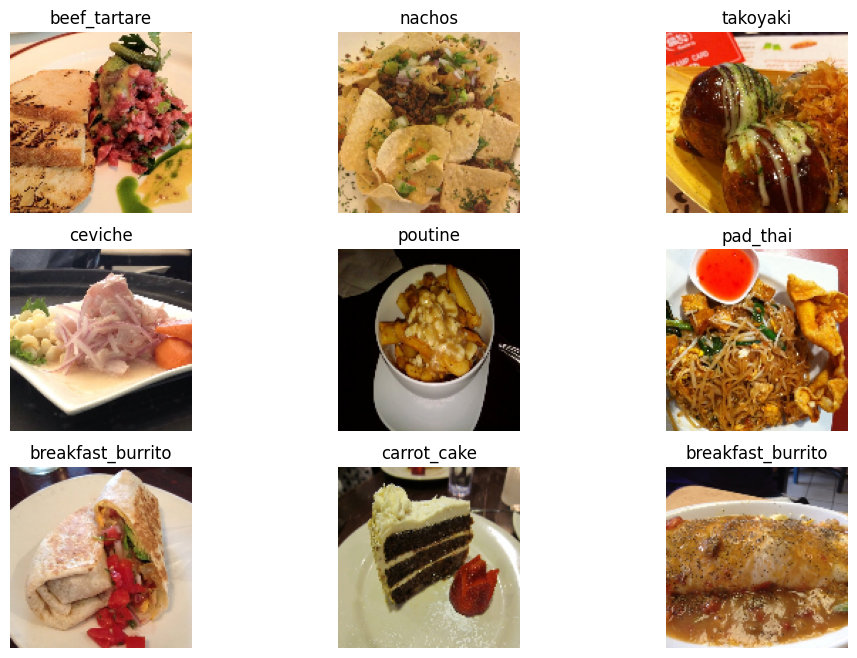

In [ ]:
def plot_sample_images(data, class_names):
    images, labels = next(data)  # Get a batch
    plt.figure(figsize=(12, 8))
    for i in range(9):
        plt.subplot(3, 3, i+1)
        plt.imshow(images[i])
        plt.title(class_names[np.argmax(labels[i])])
        plt.axis("off")
    plt.show()

plot_sample_images(train_data, class_names)


In [ ]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout

# CNN Model Architecture
model = Sequential([
    Conv2D(32, (3,3), activation='relu', input_shape=(128, 128, 3)),
    MaxPooling2D(2,2),

    Conv2D(64, (3,3), activation='relu'),
    MaxPooling2D(2,2),

    Conv2D(128, (3,3), activation='relu'),
    MaxPooling2D(2,2),

    Flatten(),
    Dense(256, activation='relu'),
    Dropout(0.5),
    Dense(len(class_names), activation='softmax')  # Output layer (one per class)
])

# Compile Model
model.compile(
    optimizer="adam",
    loss="categorical_crossentropy",
    metrics=["accuracy"]
)

# Model Summary
model.summary()


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                      │ (None, 126, 126, 32)        │             896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d (MaxPooling2D)         │ (None, 63, 63, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_1 (Conv2D)                    │ (None, 61, 61, 64)          │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_1 (MaxPooling2D)       │ (None, 30, 30, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_2 (Conv2D)                    │ (None, 28, 28, 128)         │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_2 (MaxPooling2D)       │ (None, 14, 14, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten (Flatten)                    │ (None, 25088)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 256)                 │       6,422,784 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 256)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 101)                 │          25,957 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 6,541,989 (24.96 MB)

 Trainable params: 6,541,989 (24.96 MB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
# Train the model
epochs = 10
history = model.fit(train_data, validation_data=val_data, epochs=epochs)


Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


2207/2525 ━━━━━━━━━━━━━━━━━━━━ 5:59 1s/step - accuracy: 0.0233 - loss: 4.5341

KeyboardInterrupt: 

In [ ]:
# Plot training history
def plot_training_history(history):
    plt.figure(figsize=(12, 5))

    # Accuracy Plot
    plt.subplot(1, 2, 1)
    plt.plot(history.history["accuracy"], label="Train Accuracy")
    plt.plot(history.history["val_accuracy"], label="Validation Accuracy")
    plt.xlabel("Epochs")
    plt.ylabel("Accuracy")
    plt.legend()
    plt.title("Model Accuracy")

    # Loss Plot
    plt.subplot(1, 2, 2)
    plt.plot(history.history["loss"], label="Train Loss")
    plt.plot(history.history["val_loss"], label="Validation Loss")
    plt.xlabel("Epochs")
    plt.ylabel("Loss")
    plt.legend()
    plt.title("Model Loss")

    plt.show()

plot_training_history(history)


In [ ]:
from tensorflow.keras.preprocessing import image

def predict_image(img_path, model):
    img = image.load_img(img_path, target_size=(128, 128))  # Resize
    img_array = image.img_to_array(img) / 255.0  # Normalize
    img_array = np.expand_dims(img_array, axis=0)  # Add batch dimension

    prediction = model.predict(img_array)
    predicted_class = class_names[np.argmax(prediction)]

    plt.imshow(img)
    plt.title(f"Predicted: {predicted_class}")
    plt.axis("off")
    plt.show()

# Test with a sample image
random_food_class = random.choice(class_names)
random_image_path = os.path.join(dataset_path, random_food_class, random.choice(os.listdir(os.path.join(dataset_path, random_food_class))))
predict_image(random_image_path, model)


In [ ]:
#   images in /content/food-101/food-101/__MACOSX

import os

def list_files_and_images(directory):
  """Lists files and images within a given directory.

  Args:
    directory: The path to the directory.
  """
  if not os.path.exists(directory):
    print(f"Error: Directory '{directory}' not found.")
    return

  print(f"Contents of '{directory}':")
  for item in os.listdir(directory):
    item_path = os.path.join(directory, item)
    if os.path.isfile(item_path):
      print(f"  File: {item}")
    elif os.path.isdir(item_path):
      print(f"  Directory: {item}")
    else:
      print(f"  Unknown: {item}")

# Example usage:
list_files_and_images("/content/food-101/food-101/__MACOSX")


Contents of '/content/food-101/food-101/__MACOSX':
  File: ._food-101
  Directory: food-101


Restart again , With Augmentation
  Rescales images (0-1 range)
Applies transformations (rotate, shift, shear, zoom, flip)
Splits data into 80% train / 20% validation


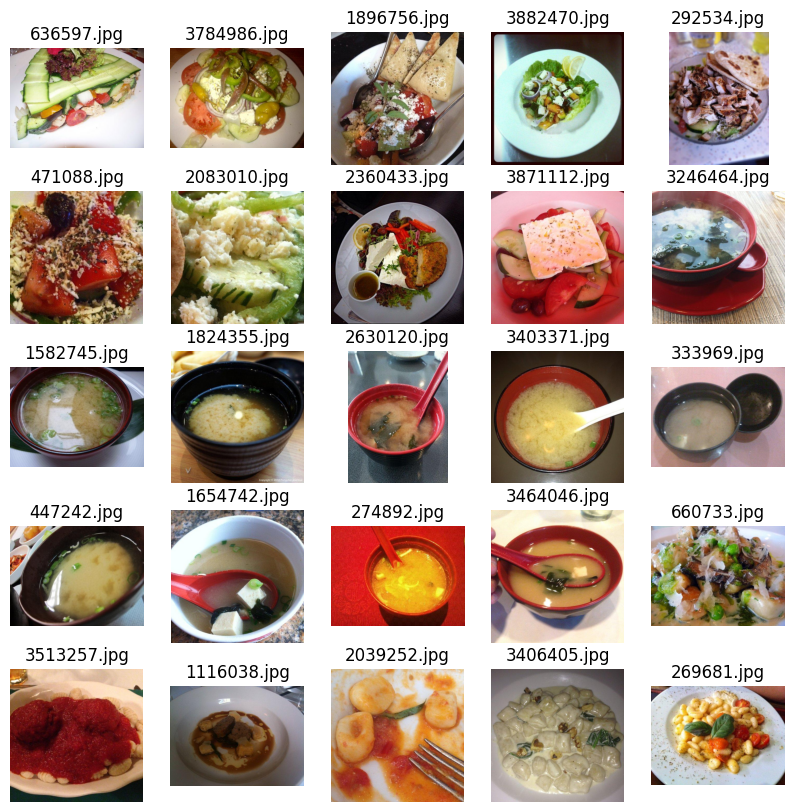

In [ ]:
#  open images from /content/drive/MyDrive/food-101-subset

import matplotlib.pyplot as plt
import os
from PIL import Image

# Assuming images are in '/content/drive/MyDrive/food-101-subset'
image_dir = '/content/drive/MyDrive/food-101-subset'

# List all files in the directory
image_files = [f for f in os.listdir(image_dir) if os.path.isfile(os.path.join(image_dir, f))]

# Display the first 25 images (adjust as needed)
plt.figure(figsize=(10, 10))
for i in range(min(25, len(image_files))):
    img_path = os.path.join(image_dir, image_files[i])
    try:
        img = Image.open(img_path)
        plt.subplot(5, 5, i + 1)
        plt.imshow(img)
        plt.title(image_files[i])  # Use filename as title
        plt.axis('off')
    except Exception as e:
        print(f"Error loading image {img_path}: {e}")

plt.show()


In [ ]:
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import matplotlib.pyplot as plt

# Define dataset path
dataset_path = "/content/drive/MyDrive/food-101-subset"

# Image size & batch size
image_size = (128, 128)
batch_size = 32

#  ImageDataGenerator with augmentation
augmented_datagen = ImageDataGenerator(
    rescale=1.0/255,  # Normalize images
    rotation_range=30,  # Rotate images randomly (0-30 degrees)
    width_shift_range=0.2,  # Horizontal shift
    height_shift_range=0.2,  # Vertical shift
    shear_range=0.2,  # Shear transformation
    zoom_range=0.2,  # Zoom in/out
    horizontal_flip=True,  # Flip images horizontally
    fill_mode='nearest',  # Fill missing pixels
    validation_split=0.2  # Split into train/validation (80/20)
)

# # Load augmented training dataset
# train_data_augmented = augmented_datagen.flow_from_directory(
#     dataset_path,
#     target_size=image_size,
#     batch_size=batch_size,
#     class_mode="categorical",
#     subset="training"
# )

# # Load validation dataset without augmentation
# val_data = ImageDataGenerator(rescale=1.0/255, validation_split=0.2).flow_from_directory(
#     dataset_path,
#     target_size=image_size,
#     batch_size=batch_size,
#     class_mode="categorical",
#     subset="validation"
# )


Found 80800 images belonging to 2 classes.


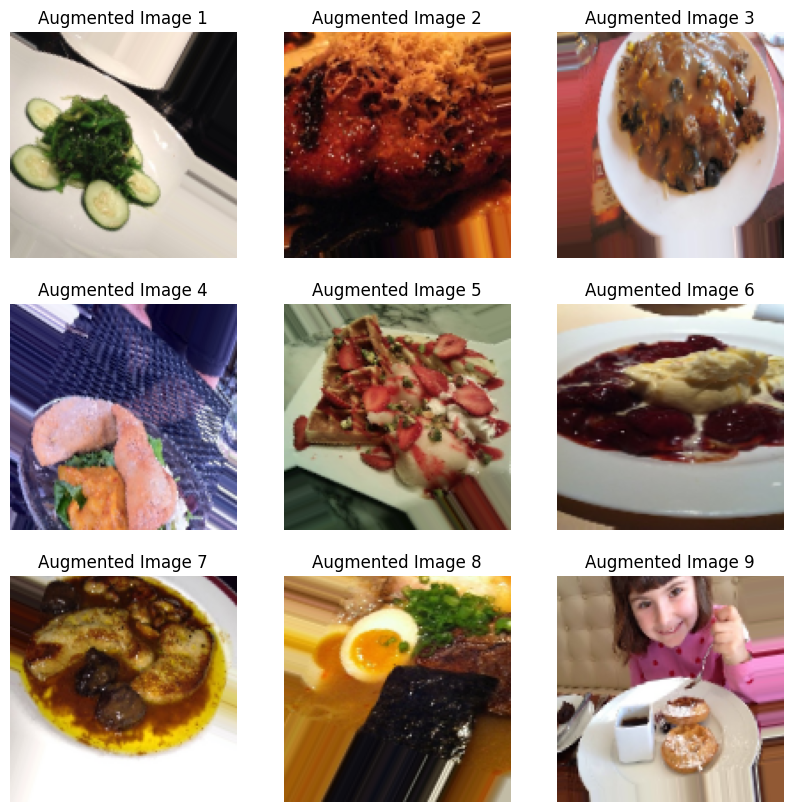

In [ ]:
#  visulaise or plot the result of rescale=1.0/255,  # Normalize images
#     rotation_range=30,  # Rotate images randomly (0-30 degrees)
#     width_shift_range=0.2,  # Horizontal shift
#     height_shift_range=0.2,  # Vertical shift
#     shear_range=0.2,  # Shear transformation
#     zoom_range=0.2,  # Zoom in/out
#     horizontal_flip=True,  # Flip images horizontally
#     fill_mode='nearest',  # Fill missing pixels
#     validation_split=0.2  #

import matplotlib.pyplot as plt
import numpy as np
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Define dataset path
dataset_path = "/content/food-101/food-101/food-101"

# Image size & batch size
image_size = (128, 128)
batch_size = 32

#  ImageDataGenerator with augmentation
augmented_datagen = ImageDataGenerator(
    rescale=1.0/255,  # Normalize images
    rotation_range=30,  # Rotate images randomly (0-30 degrees)
    width_shift_range=0.2,  # Horizontal shift
    height_shift_range=0.2,  # Vertical shift
    shear_range=0.2,  # Shear transformation
    zoom_range=0.2,  # Zoom in/out
    horizontal_flip=True,  # Flip images horizontally
    fill_mode='nearest',  # Fill missing pixels
    validation_split=0.2  # Split into train/validation (80/20)
)

# Load augmented training dataset
train_data_augmented = augmented_datagen.flow_from_directory(
    dataset_path,
    target_size=image_size,
    batch_size=batch_size,
    class_mode="categorical",
    subset="training"
)

# Get a batch of augmented images and labels
images, labels = next(train_data_augmented)

# Plot a few augmented images
plt.figure(figsize=(10, 10))
for i in range(9):  # Display 9 images
    plt.subplot(3, 3, i + 1)
    plt.imshow(images[i])
    plt.title(f"Augmented Image {i+1}")
    plt.axis('off')
plt.show()


Found 80800 images belonging to 2 classes.


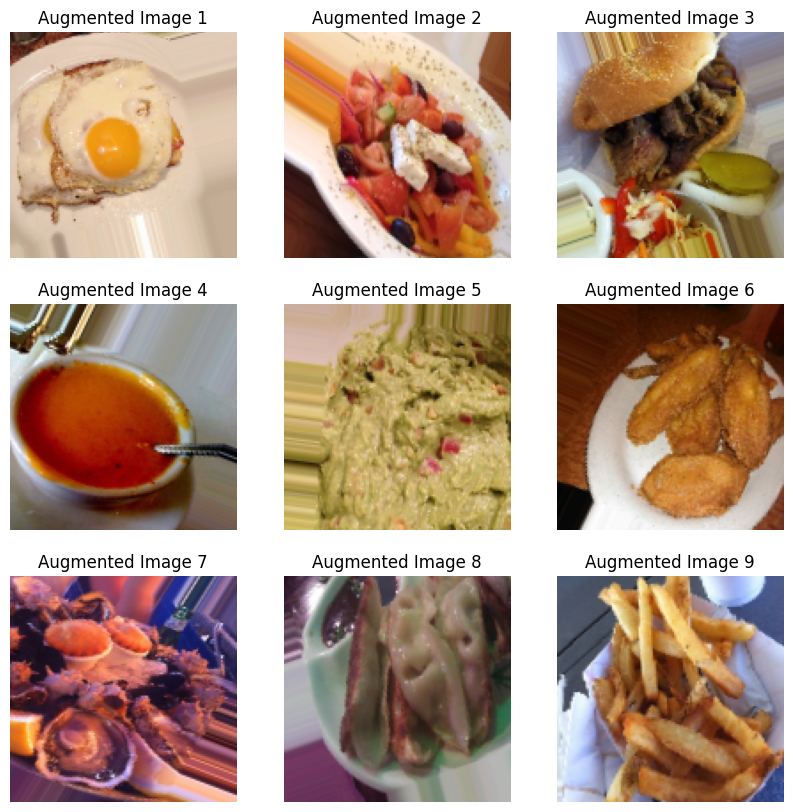

Found 80800 images belonging to 101 classes.
Found 80800 images belonging to 101 classes.


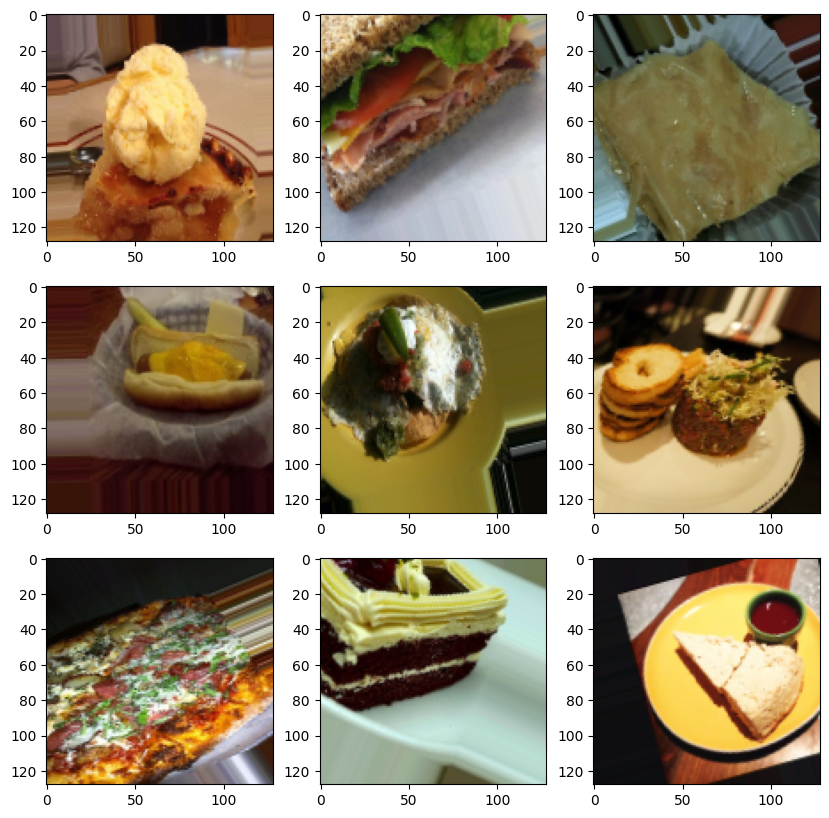

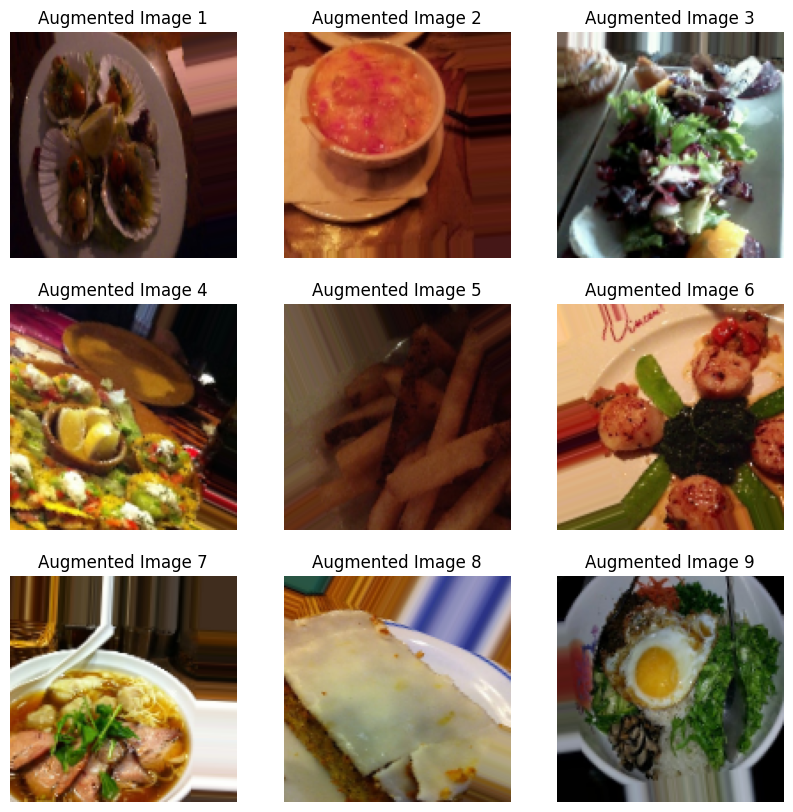

Found 80800 images belonging to 101 classes.


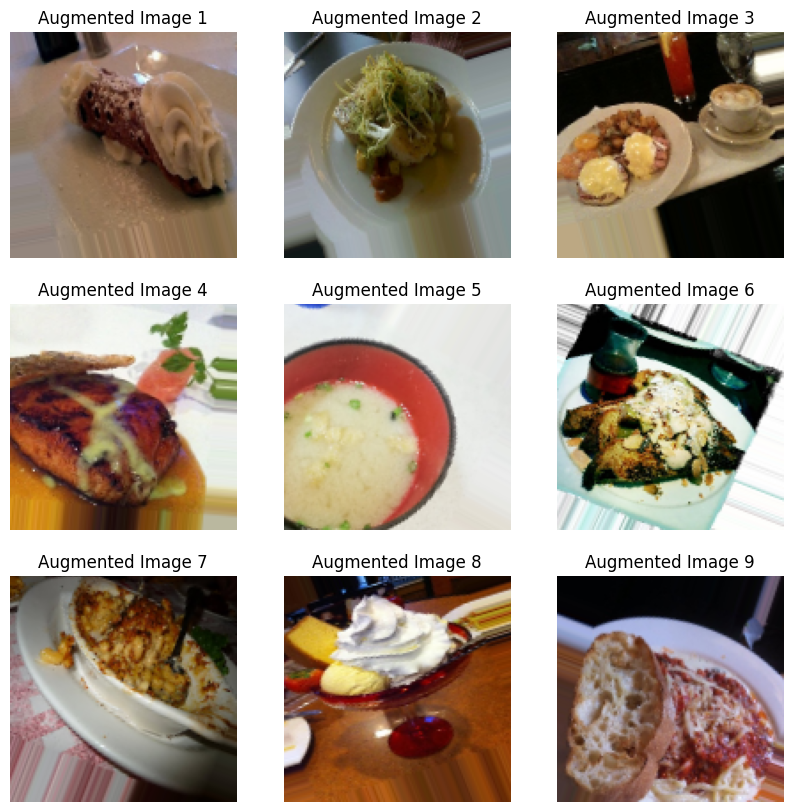

In [ ]:


import matplotlib.pyplot as plt
import numpy as np
from tensorflow.keras.preprocessing.image import ImageDataGenerator



import matplotlib.pyplot as plt
import numpy as np
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Define dataset path - Make sure this path is correct and points
# to the directory containing your images organized into subdirectories for each class
dataset_path = "/content/food-101/food-101/food-101"

# Image size & batch size
image_size = (128, 128)
batch_size = 32

# Create an ImageDataGenerator with augmentation
augmented_datagen = ImageDataGenerator(
    rescale=1.0/255,  # Normalize images
    rotation_range=30,  # Rotate images randomly (0-30 degrees)
    width_shift_range=0.2,  # Horizontal shift
    height_shift_range=0.2,  # Vertical shift
    shear_range=0.2,  # Shear transformation
    zoom_range=0.2,  # Zoom in/out
    horizontal_flip=True,  # Flip images horizontally
    fill_mode='nearest',  # Fill missing pixels
    validation_split=0.2  # Split into train/validation (80/20)
)

# Load augmented training dataset
train_data_augmented = augmented_datagen.flow_from_directory(
    dataset_path,
    target_size=image_size,
    batch_size=batch_size,
    class_mode="categorical",
    subset="training"
)

# Get a batch of augmented images and labels
images, labels = next(train_data_augmented)

# Plot a few augmented images
plt.figure(figsize=(10, 10))
for i in range(9):  # Display 9 images
    plt.subplot(3, 3, i + 1)
    plt.imshow(images[i])
    plt.title(f"Augmented Image {i+1}")
    plt.axis('off')
plt.show()
#     height_shift_range=0.2,  # Vertical shift
#     shear_range=0.2,  # Shear transformation
#     zoom_range=0.2,  # Zoom in/out
#     horizontal_flip=True,  # Flip images horizontally
#     fill_mode='nearest',  # Fill missing pixels
#     validation_split=0.2  #

import matplotlib.pyplot as plt
import numpy as np
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Define dataset path - Make sure this path is correct and points
# to the directory containing your images organized into subdirectories for each class
dataset_path = "/content/food-101/food-101/food-101/images"

# Image size & batch size
image_size = (128, 128)
batch_size = 32

# Create an ImageDataGenerator with augmentation
augmented_datagen = ImageDataGenerator(
    rescale=1.0/255,  # Normalize images
    rotation_range=30,  # Rotate images randomly (0-30 degrees)
    width_shift_range=0.2,  # Horizontal shift
    height_shift_range=0.2,  # Vertical shift
    shear_range=0.2,  # Shear transformation
    zoom_range=0.2,  # Zoom in/out
    horizontal_flip=True,  # Flip images horizontally
    fill_mode='nearest',  # Fill missing pixels
    validation_split=0.2  # Split into train/validation (80/20)
)

# Load augmented training dataset
train_data_augmented = augmented_datagen.flow_from_directory(
    dataset_path,
    target_size=image_size,
    batch_size=batch_size,
    class_mode="categorical",
    subset="training"
)

# Get a batch of augmented images and labels
images, labels = next(train_data_augmented)

# Plot a few augmented images
plt.figure(figsize=(10, 10))
for i in range(9):  # Display 9 images
    plt.subplot(3, 3, i + 1)
    plt.imshow(images[i])
# prompt: to visulaise or plot the result of rescale=1.0/255,  # Normalize images
#     rotation_range=30,  # Rotate images randomly (0-30 degrees)
#     width_shift_range=0.2,  # Horizontal shift
#     height_shift_range=0.2,  # Vertical shift
#     shear_range=0.2,  # Shear transformation
#     zoom_range=0.2,  # Zoom in/out
#     horizontal_flip=True,  # Flip images horizontally
#     fill_mode='nearest',  # Fill missing pixels
#     validation_split=0.2  #

import matplotlib.pyplot as plt
import numpy as np
from tensorflow.keras.preprocessing.image import ImageDataGenerator


dataset_path = "/content/food-101/food-101/food-101/images"

# Image size & batch size
image_size = (128, 128)
batch_size = 32

#  ImageDataGenerator with augmentation
augmented_datagen = ImageDataGenerator(
    rescale=1.0/255,  # Normalize images
    rotation_range=30,  # Rotate images randomly (0-30 degrees)
    width_shift_range=0.2,  # Horizontal shift
    height_shift_range=0.2,  # Vertical shift
    shear_range=0.2,  # Shear transformation
    zoom_range=0.2,  # Zoom in/out
    horizontal_flip=True,  # Flip images horizontally
    fill_mode='nearest',  # Fill missing pixels
    validation_split=0.2  # Split into train/validation (80/20)
)

# Load augmented training dataset
train_data_augmented = augmented_datagen.flow_from_directory(
    dataset_path,
    target_size=image_size,
    batch_size=batch_size,
    class_mode="categorical",
    subset="training"
)

# Get a batch of augmented images and labels
images, labels = next(train_data_augmented)

#  few augmented images
plt.figure(figsize=(10, 10))
for i in range(9):  # Display 9 images
    plt.subplot(3, 3, i + 1)
    plt.imshow(images[i])
    plt.title(f"Augmented Image {i+1}")
    plt.axis('off')
plt.show()
image_size = (128, 128)
batch_size = 32

# Create an ImageDataGenerator with augmentation
augmented_datagen = ImageDataGenerator(
    rescale=1.0/255,  # Normalize images
    rotation_range=30,  # Rotate images randomly (0-30 degrees)
    width_shift_range=0.2,  # Horizontal shift
    height_shift_range=0.2,  # Vertical shift
    shear_range=0.2,  # Shear transformation
    zoom_range=0.2,  # Zoom in/out
    horizontal_flip=True,  # Flip images horizontally
    fill_mode='nearest',  # Fill missing pixels
    validation_split=0.2  # Split into train/validation (80/20)
)

# Load augmented training dataset
train_data_augmented = augmented_datagen.flow_from_directory(
    dataset_path,
    target_size=image_size,
    batch_size=batch_size,
    class_mode="categorical",
    subset="training"
)

# Get a batch of augmented images and labels
images, labels = next(train_data_augmented)

#  few augmented images
plt.figure(figsize=(10, 10))
for i in range(9):  # Display 9 images
    plt.subplot(3, 3, i + 1)
    plt.imshow(images[i])
    plt.title(f"Augmented Image {i+1}")
    plt.axis('off')
plt.show()

In [ ]:
# Load augmented training dataset
train_data_augmented = augmented_datagen.flow_from_directory(
    dataset_path,
    target_size=image_size,
    batch_size=batch_size,
    class_mode="categorical",
    subset="training"
)

# Load validation dataset without augmentation
val_data = ImageDataGenerator(rescale=1.0/255, validation_split=0.2).flow_from_directory(
    dataset_path,
    target_size=image_size,
    batch_size=batch_size,
    class_mode="categorical",
    subset="validation"
)


Found 80800 images belonging to 101 classes.
Found 20200 images belonging to 101 classes.


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


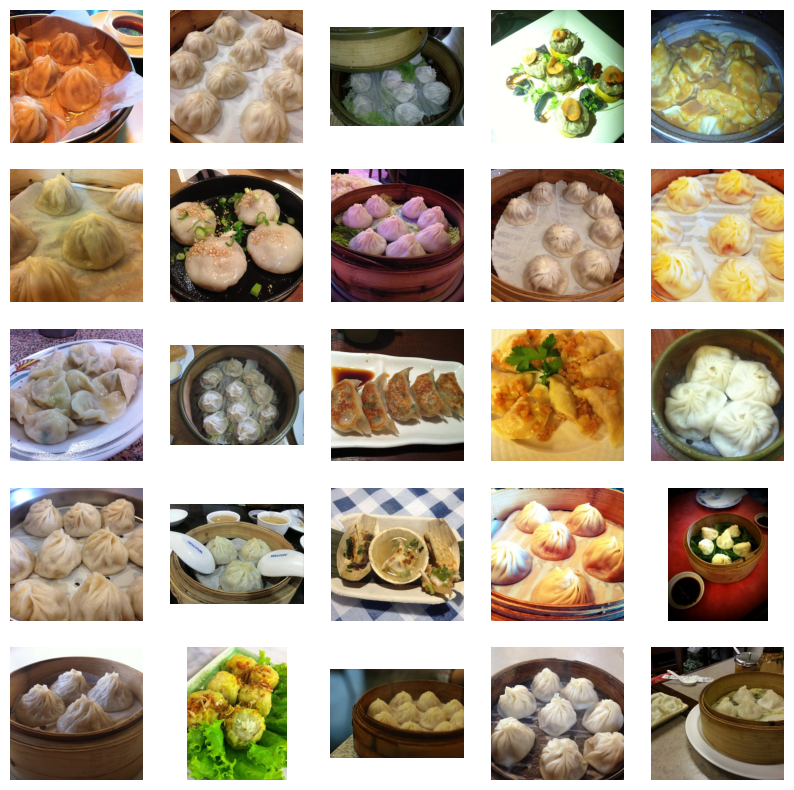

Total images loaded: 101000


In [ ]:
#  the images in file /content/drive/MyDrive/food-101-subset

import os
from PIL import Image
import matplotlib.pyplot as plt

# Define the directory containing the images
image_dir = "/content/food-101/food-101/food-101"

# Initialize lists to store image data
image_files = []
images = []

# Iterate through all files and subdirectories within the image directory
for root, _, files in os.walk(image_dir):
    for file in files:
        # Check if the file is an image (you might want to add more image extensions)
        if file.lower().endswith(('.png', '.jpg', '.jpeg')):
            image_path = os.path.join(root, file)
            image_files.append(image_path)

            try:
              # Open and append the image to the list
              img = Image.open(image_path)
              images.append(img)
            except IOError:
              print(f"Error opening image: {image_path}")


# Display the first few images (optional)
plt.figure(figsize=(10, 10))
for i in range(min(len(images), 25)): # Display up to 25 images
    plt.subplot(5, 5, i + 1)
    plt.imshow(images[i])
    plt.axis('off')
plt.show()

print(f"Total images loaded: {len(images)}")


Step 2: Visualize Augmented Images
Let's preview how our data augmentation works.

Found 101000 images belonging to 101 classes.


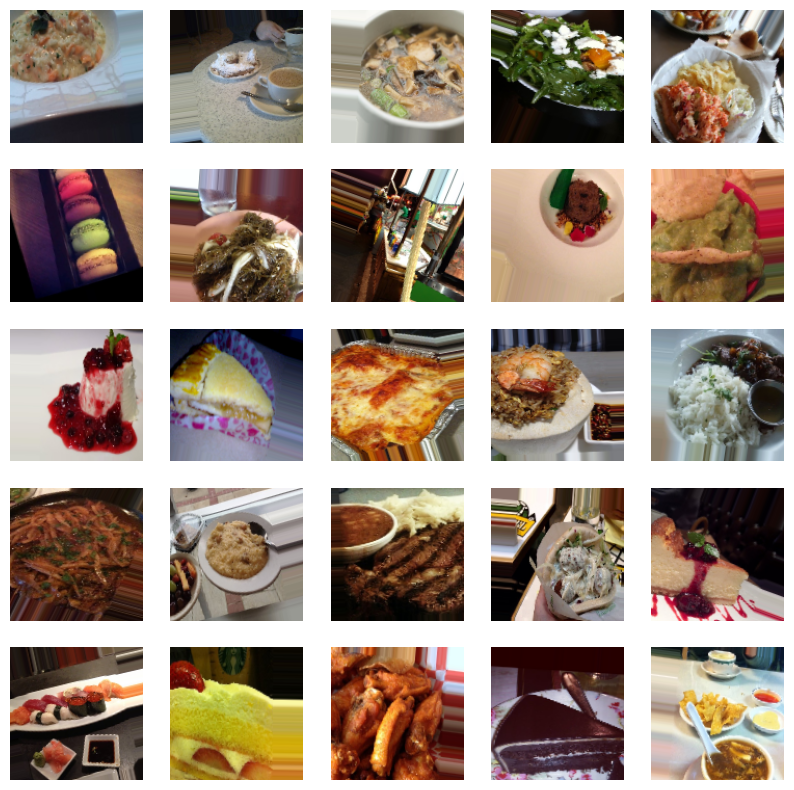

In [ ]:
#  A batch of augmented images for image_dir

import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import os
from PIL import Image

# Define the directory containing the images
#image_dir = "/content/food-101/food-101/food-101"
image_dir ='/content/food-101/food-101/food-101/images'

# Image size & batch size
image_size = (128, 128)
batch_size = 32

# Create an ImageDataGenerator with augmentation
augmented_datagen = ImageDataGenerator(
    rescale=1.0/255,  # Normalize images
    rotation_range=30,  # Rotate images randomly (0-30 degrees)
    width_shift_range=0.2,  # Horizontal shift
    height_shift_range=0.2,  # Vertical shift
    shear_range=0.2,  # Shear transformation
    zoom_range=0.2,  # Zoom in/out
    horizontal_flip=True,  # Flip images horizontally
    fill_mode='nearest',  # Fill missing pixels
)


# Load augmented training dataset
train_data_augmented = augmented_datagen.flow_from_directory(
    image_dir,
    target_size=image_size,
    batch_size=batch_size,
    class_mode="categorical",
)


# Get a batch of augmented images
augmented_images, _ = next(train_data_augmented)


# Display the augmented images
plt.figure(figsize=(10, 10))
for i in range(min(augmented_images.shape[0], 25)):
    plt.subplot(5, 5, i + 1)
    plt.imshow(augmented_images[i])
    plt.axis('off')
plt.show()


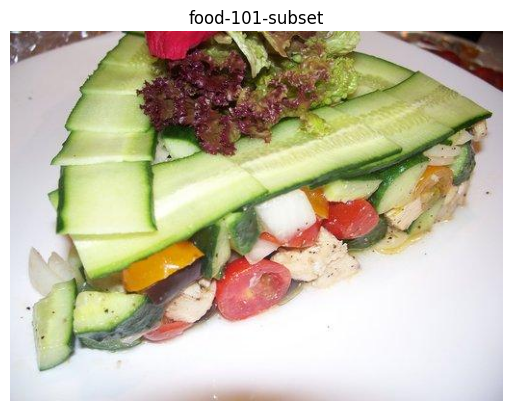

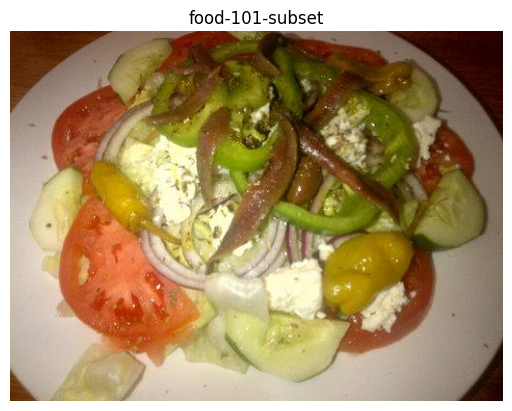

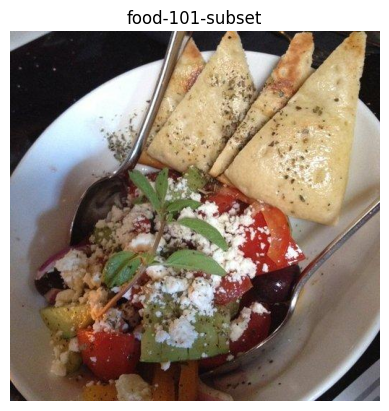

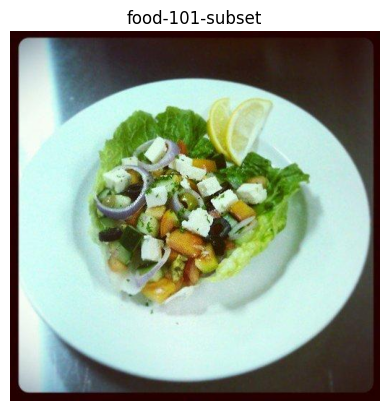

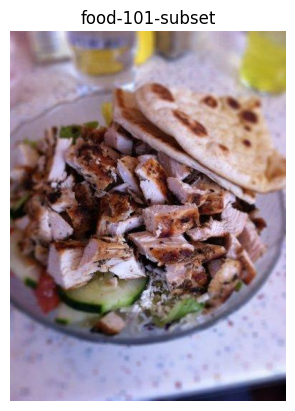

/content/drive/MyDrive/food-101-subset/636597.jpg
food-101-subset
Image size: (512, 384)


In [ ]:
# Experiment fo trying to make classes for the above images
import matplotlib.pyplot as plt
import os
from PIL import Image

class FoodImage:
    def __init__(self, image_path, label):
        self.image_path = image_path  # Use image_path directly
        self.label = label
        self.image = None  # Placeholder for the image data

    def load_image(self):
        try:
            self.image = Image.open(self.image_path)
            return True  # Indicate success
        except (FileNotFoundError, IOError) as e:
            print(f"Error loading image {self.image_path}: {e}")
            return False  # Indicate failure

    def get_image_size(self):
      if self.image:
        return self.image.size  # Return (width, height)
      else:
        return None

    def show_image(self):
        if self.image:
            plt.imshow(self.image)
            plt.title(self.label)
            plt.axis('off')
            plt.show()
        else:
            print("Image not loaded.")

# Example usage (assuming 'image_paths' and 'labels' are already defined):
# Assuming your image filenames contain the labels (e.g., apple_pie_001.jpg)
food_images = []
for image_path in image_files: # Iterate through the list of image paths
  label = os.path.basename(os.path.dirname(image_path)) # Extract label from directory name
  food_image = FoodImage(image_path, label)
  if food_image.load_image():  # Load the image and check if it was successful
      food_images.append(food_image)
# Now 'food_images' is a list of FoodImage objects. You can access their properties.

for food_image in food_images[:5]:  #Example: show first 5
  food_image.show_image()

#Access properties
print(food_images[0].image_path)
print(food_images[0].label)
size = food_images[0].get_image_size() # get the size of the first image
#if size:
print(f"Image size: {size}")

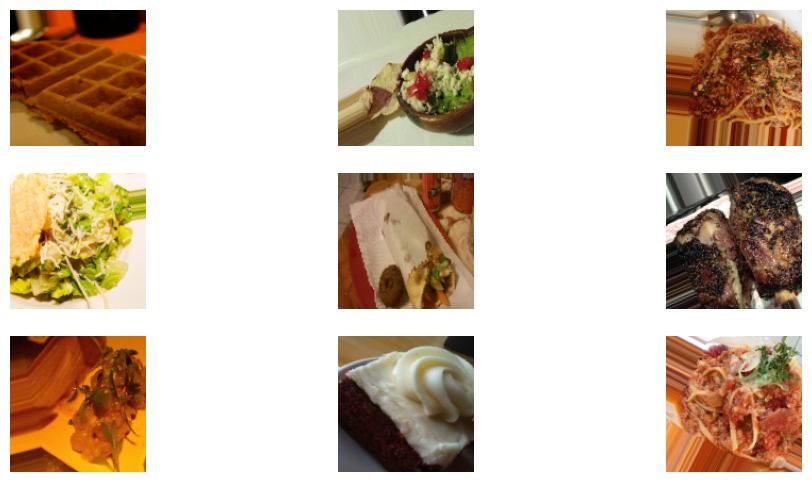

In [ ]:
# Get a batch of augmented images
augmented_images, _ = next(train_data_augmented)

# Plot augmented images
plt.figure(figsize=(12, 6))
for i in range(9):
    plt.subplot(3, 3, i+1)
    plt.imshow(augmented_images[i])
    plt.axis("off")
plt.show()


Step 3: Train CNN with Augmented Data
Now, we train a CNN model using the augmented dataset.

In [ ]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout

# Define CNN Model
model = Sequential([
    Conv2D(32, (3,3), activation='relu', input_shape=(128, 128, 3)),
    MaxPooling2D(2,2),

    Conv2D(64, (3,3), activation='relu'),
    MaxPooling2D(2,2),

    Conv2D(128, (3,3), activation='relu'),
    MaxPooling2D(2,2),

    Flatten(),
    Dense(256, activation='relu'),
    Dropout(0.5),
    Dense(len(train_data_augmented.class_indices), activation='softmax')
])

# Compile Model
model.compile(
    optimizer="adam",
    loss="categorical_crossentropy",
    metrics=["accuracy"]
)

image_size = (224, 224): This line sets the image_size variable to (224, 224), which is the expected input size for MobileNetV2.
target_size=image_size: Inside the flow_from_directory function of ImageDataGenerator, the target_size argument is set to image_size, ensuring that the generated images will be resized to 224x224 before being fed to the model.

In [ ]:
# In your data augmentation section:
image_size = (224, 224)  # Make sure image_size is (224, 224)

# Then create your augmented data generator:
from tensorflow.keras.preprocessing.image import ImageDataGenerator
augmented_datagen = ImageDataGenerator(
    rescale=1.0/255,
    rotation_range=30,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest',
)

train_data_augmented = augmented_datagen.flow_from_directory(
    image_dir,
    target_size=image_size,  # Make sure target_size matches
    batch_size=batch_size,
    class_mode="categorical",
)
augmented_datagen = ImageDataGenerator(
    rescale=1.0/255,
    rotation_range=30,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest',
)

train_data_augmented = augmented_datagen.flow_from_directory(
    image_dir,
    target_size=image_size,  # Make sure target_size matches
    batch_size=batch_size,
    class_mode="categorical",
)
augmented_datagen = ImageDataGenerator(
    rescale=1.0/255,
    rotation_range=30,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest',
)

train_data_augmented = augmented_datagen.flow_from_directory(
    image_dir,
    target_size=image_size,  # Make sure target_size matches
    batch_size=batch_size,
    class_mode="categorical",
)
augmented_datagen = ImageDataGenerator(
    rescale=1.0/255,
    rotation_range=30,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest',
)

train_data_augmented = augmented_datagen.flow_from_directory(
    image_dir,
    target_size=image_size,  # Make sure target_size matches
    batch_size=batch_size,
    class_mode="categorical",
)

In [ ]:

# Train Model with Augmented Data
epochs = 5
history = model.fit(train_data_augmented, validation_data=val_data, epochs=epochs)


/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/2


ValueError: Input 0 of layer "functional_2" is incompatible with the layer: expected shape=(None, 224, 224, 3), found shape=(None, 128, 128, 3)

Summary

Trains CNN using augmented dataset.
Improves generalization to avoid overfitting.
Applied data augmentation (rotation, flipping, zooming, etc.)
Visualized augmented images
Trained a CNN model with augmented data



Need to increase Epochs → Train for 25+ epochs for better accuracy.
Use Transfer Learning → need to Try ResNet50 or MobileNetV2 for better result, instead from sctach.
Fine-tune Augmentation → Experiment with different parameters.
###Gradio deployment or real-time testing !

###Transfer Learning for Food-101 Image Classification

Using Transfer Learning with MobileNetV2, a pre-trained model, we can classify food images more efficiently instead of training from scratch.

Loads Food-101 images
Applies augmentation (flip, rotate, zoom)
Splits into train (80%) & validation (20%)


In [ ]:
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Define dataset path (Upload or mount Food-101)
dataset_path = '/content/food-101/food-101/food-101/images'


# Image size & batch size
image_size = (224, 224)  # Required for MobileNetV2
batch_size = 32

# Augment Data
train_datagen = ImageDataGenerator(
    rescale=1.0/255, rotation_range=30, width_shift_range=0.2,
    height_shift_range=0.2, shear_range=0.2, zoom_range=0.2,
    horizontal_flip=True, validation_split=0.2
)

# Load Train & Validation Data
train_data = train_datagen.flow_from_directory(
    dataset_path, target_size=image_size, batch_size=batch_size, class_mode="categorical", subset="training"
)

val_data = train_datagen.flow_from_directory(
    dataset_path, target_size=image_size, batch_size=batch_size, class_mode="categorical", subset="validation"
)

num_classes = len(train_data.class_indices)  # Number of food categories


Found 80800 images belonging to 101 classes.
Found 20200 images belonging to 101 classes.


Step 2: Load MobileNetV2 Pretrained Model

Loads MobileNetV2 (pre-trained on ImageNet)
Freezes layers (avoids training the entire model)
Adds custom classification layers

In [ ]:
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.layers import Dense, Dropout, GlobalAveragePooling2D
from tensorflow.keras.models import Model

# Load Pretrained MobileNetV2 (Exclude final layer)
base_model = MobileNetV2(input_shape=(224, 224, 3), include_top=False, weights="imagenet")

# Freeze base model layers (Prevents re-training)
base_model.trainable = False

# Add Custom Classification Head
x = base_model.output
x = GlobalAveragePooling2D()(x)  # Reduces dimensionality
x = Dense(256, activation="relu")(x)
x = Dropout(0.5)(x)  # Prevents overfitting
output_layer = Dense(num_classes, activation="softmax")(x)  # Final prediction

# Build Final Model
model = Model(inputs=base_model.input, outputs=output_layer)


9406464/9406464 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


Step 3: Compile & Train Model

In [ ]:
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Define dataset path (Upload or mount Food-101)
#dataset_path = '/content/food-101/food-101'  # Corrected path
datset_path = '/content/food-101/food-101/food-101/images'

# Image size & batch size
image_size = (224, 224)  # Required for MobileNetV2
batch_size = 32

# Augment Data
train_datagen = ImageDataGenerator(
    rescale=1.0/255, rotation_range=30, width_shift_range=0.2,
    height_shift_range=0.2, shear_range=0.2, zoom_range=0.2,
    horizontal_flip=True, validation_split=0.2
)

# Load Train & Validation Data
train_data = train_datagen.flow_from_directory(
    dataset_path, target_size=image_size, batch_size=batch_size,
    class_mode="categorical", subset="training"
)

val_data = train_datagen.flow_from_directory(
    dataset_path, target_size=image_size, batch_size=batch_size,
    class_mode="categorical", subset="validation"
)

num_classes = len(train_data.class_indices)  # Number of food categories

# ... (rest of your code for loading and compiling the model) ...

# Train Model
#epochs = 5  # Adjust based on Colab runtime limits
#history = model.fit(train_data, validation_data=val_data, epochs=epochs)

In [ ]:
# Compile Model
model.compile(optimizer="adam", loss="categorical_crossentropy", metrics=["accuracy"])




In [ ]:
# Train Model
epochs = 5  # Adjust based on Colab runtime limits
history = model.fit(train_data, validation_data=val_data, epochs=epochs)

Epoch 1/2
1343/2525 ━━━━━━━━━━━━━━━━━━━━ 31:19 2s/step - accuracy: 0.1319 - loss: 3.8981

KeyboardInterrupt: 

Step 4: Test & Evaluate Model

In [ ]:
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Define dataset path (Upload or mount Food-101)
dataset_path = '/content/food-101/food-101'  # Corrected path - add /images

# Image size & batch size
image_size = (224, 224)  # Required for MobileNetV2
batch_size = 32

# Augment Data
train_datagen = ImageDataGenerator(
    rescale=1.0/255, rotation_range=30, width_shift_range=0.2,
    height_shift_range=0.2, shear_range=0.2, zoom_range=0.2,
    horizontal_flip=True, validation_split=0.2
)

# Load Train & Validation Data
train_data = train_datagen.flow_from_directory(
    dataset_path, target_size=image_size, batch_size=batch_size,
    class_mode="categorical", subset="training"
)

val_data = train_datagen.flow_from_directory(
    dataset_path, target_size=image_size, batch_size=batch_size,
    class_mode="categorical", subset="validation"
)

num_classes = len(train_data.class_indices)  # Number of food categories


Found 161600 images belonging to 2 classes.
Found 40400 images belonging to 2 classes.


In [ ]:
# Evaluate Performance
loss, acc = model.evaluate(val_data)
print(f"Validation Accuracy: {acc*100:.2f}%")

# Save Model
model.save("food101_mobilenetv2.h5")


In [ ]:
!ls -l


total 1500
drwx------ 6 root root    4096 Feb 22 08:26  drive
-rw-r--r-- 1 root root 1502291 Feb 22 08:31  merged_data.csv
-rw-r--r-- 1 root root   13341 Feb 22 08:31 'Nutrition Assistance_chatbot.csv'
-rw-r--r-- 1 root root    7141 Feb 22 08:31 'Pizza Recipe.pdf'
drwxr-xr-x 1 root root    4096 Feb 20 14:24  sample_data


 ### Deploy with Gradio

In [ ]:
import tensorflow as tf  # Import TensorFlow at the be
import gradio as gr
import numpy as np
from tensorflow.keras.preprocessing import image

from google.colab import drive
drive.mount('/content/drive')

#
model = tf.keras.models.load_model("/content/drive/MyDrive/food101_mobilenetv2.h5")

# Load Model
model = tf.keras.models.load_model("food101_mobilenetv2.h5")

# Function to Predict Food Category
def predict_food(img):
    img = img.resize((224, 224))  # Resize image
    img_array = image.img_to_array(img) / 255.0
    img_array = np.expand_dims(img_array, axis=0)
    predictions = model.predict(img_array)
    class_names = list(train_data.class_indices.keys())  # Get class labels
    return {class_names[i]: float(predictions[0][i]) for i in range(len(class_names))}

# Gradio Interface
iface = gr.Interface(fn=predict_food, inputs=gr.Image(), outputs=gr.Label(), title="Food-101 Classifier")
iface.launch()


FileNotFoundError: [Errno 2] Unable to synchronously open file (unable to open file: name = 'food101_mobilenetv2.h5', errno = 2, error message = 'No such file or directory', flags = 0, o_flags = 0)

In [ ]:
!pip install gradio

In [ ]:
import pandas as pd
import numpy as np
import gradio as gr
import torch
from transformers import pipeline, AutoModelForSeq2SeqLM, AutoTokenizer
from tensorflow.keras.models import load_model
from tensorflow.keras.preprocessing import image
import random
import geopy.distance
from PIL import Image

# Load CSV Data
df = pd.read_csv('/content/df5.csv').head(100)

# Load Transformer Model for Chatbot
chatbot_pipeline = pipeline("text-generation", model="meta-llama/Meta-Llama-3-8B")

# Load Food-101 Trained Model (Transfer Learning)
food_model = load_model("/content/df5.csv")
class_labels = list(df['category'].unique())  # Get category labels

# Function: Find Nearest Restaurant
def find_nearest(lat, lon):
    distances = df[['restaurant_id', 'category', 'latitude', 'longitude']].copy()
    distances['distance'] = distances.apply(lambda row: geopy.distance.geodesic(
        (lat, lon), (row['latitude'], row['longitude'])).km, axis=1)
    nearest = distances.sort_values(by='distance').iloc[0]
    return f"Nearest restaurant: {nearest['category']} (Restaurant ID: {nearest['restaurant_id']}, {nearest['distance']:.2f} km away)"

# Function: Predict Food from Image
def predict_food(img):
    img = img.resize((224, 224))  # Resize image
    img_array = image.img_to_array(img) / 255.0
    img_array = np.expand_dims(img_array, axis=0)
    predictions = food_model.predict(img_array)
    return {class_labels[i]: float(predictions[0][i]) for i in range(len(class_labels))}

# Function: Get Sentiment-Based Review
def get_review(category, restaurant_id):
    reviews = df[(df['category'] == category) & (df['restaurant_id'] == restaurant_id)][['cleaned_reviews', 'sentiment']]
    if not reviews.empty:
        review = reviews.sample(1).iloc[0]
        return f"Review: {review['cleaned_reviews']} | Sentiment: {review['sentiment']}"
    return "No reviews available."

# Function: Generate Food-Related Proverb
def random_proverb():
    proverbs = [
        "An apple a day keeps the doctor away!",
        "There is no sincerer love than the love of food.",
        "Eat to live, don’t live to eat.",
        "Good food ends with good talk."
    ]
    return random.choice(proverbs)

# Function: Chatbot Response
def chatbot_response(user_input, lat=None, lon=None, budget=None, img=None):
    user_input = user_input.lower()
    response = "I can help you with food recommendations, reviews, and nearby restaurants!"

    # Check if the user uploaded an image
    if img:
        return predict_food(img)

    # Nearest Restaurant Query
    if lat and lon:
        return find_nearest(lat, lon)

    # Budget Query
    if budget:
        budget_matches = df[df['price'].str.extract(r'(\d+\.\d+)').astype(float) <= budget]
        if not budget_matches.empty:
            response = f"Budget-friendly options: {', '.join(budget_matches['category'].unique())}"

    # Sentiment-Based Review Query
    if "review" in user_input or "comment" in user_input:
        for category in df['category'].unique():
            if category.lower() in user_input:
                restaurant_id = df[df['category'] == category]['restaurant_id'].iloc[0]
                response = get_review(category, restaurant_id)

    # Generate a natural chatbot response
    else:
        generated_response = chatbot_pipeline(user_input, max_length=100, do_sample=True)[0]['generated_text']
        response = generated_response

    # Add a random food proverb
    response += f"\n\n🍽️ {random_proverb()}"
    return response

# Gradio Interface
iface = gr.Interface(
    fn=chatbot_response,
    inputs=[
        gr.Textbox(label='Ask about food or restaurants!'),
        gr.Number(label='Your Latitude (optional)'),
        gr.Number(label='Your Longitude (optional)'),
        gr.Number(label='Budget (optional)'),
        gr.Image(type='pil', label='Upload Food Image (optional)')
    ],
    outputs=gr.Textbox(label='Chatbot Response'),
    title="🍕 Food & Restaurant AI Chatbot 🍔",
    description="An AI chatbot that recommends food, finds restaurants, analyzes reviews, and detects food from images!",
    theme="compact"
)

iface.launch()


In [ ]:
!pip install gradio
!pip install PyPDF2
import gradio as gr
import pandas as pd
import random
import torch
from transformers import pipeline
from geopy.distance import geodesic
from PIL import Image
from torchvision import transforms
from torchvision.models import resnet50
import PyPDF2

# Load Data (First 100 rows for speed)
csv_path = '/content/merged_data.csv'  # Ensure this path is correct
data = pd.read_csv(csv_path).head(100)

# Load Nutrition Data
nutrition_csv_path = '/content/Nutrition Assistance_chatbot.csv'
nutrition_data = pd.read_csv(nutrition_csv_path)

# Load Pretrained Text Model (GPT-3.5 alternative)
#chatbot = pipeline("text-generation", model="mistralai/Mistral-7B-Instruct-v0.1")
chatbot = pipeline('text2text-generation',
                    model='google/flan-t5-base',
                    tokenizer='google/flan-t5-base')
# Load Image Recognition Model (Food-101 based)
model = resnet50(pretrained=True)
model.eval()
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
])

# Load Recipe PDF
pdf_path = '/content/Pizza Recipe.pdf'
def extract_recipe(query):
    with open(pdf_path, "rb") as f:
        reader = PyPDF2.PdfReader(f)
        text = "\n".join([page.extract_text() for page in reader.pages if page.extract_text()])
    return next((line for line in text.split('\n') if query.lower() in line.lower()), "Recipe not found. Using AI response...")

# Sample food proverbs
food_proverbs = [
    "An apple a day keeps the doctor away! 🍏",
    "Eat to live, don’t live to eat. 🍽️",
    "Hunger is the best sauce. 🍲",
]

# Function to generate chatbot response
def chatbot_response(user_input, lat=None, lon=None, budget=None, image=None):
    response = ""

    # Image Recognition
    if image is not None:
        img = Image.open(image).convert('RGB')
        img = transform(img).unsqueeze(0)
        with torch.no_grad():
            outputs = model(img)
        _, predicted = outputs.max(1)
        response += f"Food detected: {predicted.item()} 🍽️\n"

    # Recipe Query
    if "recipe" in user_input.lower():
        recipe = extract_recipe(user_input)
        response += f"Recipe: {recipe}\n"

    # Calorie and Diet Query
    if "calorie" in user_input.lower() or "diet" in user_input.lower():
        nutrition_match = nutrition_data[nutrition_data.apply(lambda row: user_input.lower() in str(row).lower(), axis=1)]
        if not nutrition_match.empty:
            total_calories = nutrition_match["Calories"].sum()
            response += f"Nutrition Info: {nutrition_match.to_string(index=False)}\nTotal Calories: {total_calories} kcal\n"

    # Food Recommendation based on CSV
    if user_input:
        matches = data[data.apply(lambda row: user_input.lower() in str(row).lower(), axis=1)]
        if not matches.empty:
            for _, row in matches.iterrows():
                response += f"{row['name']} - {row['price']} USD - Rating: {row['sentiment']}\n"

    # Nearest Restaurant Suggestion
    if lat and lon:
        user_location = (float(lat), float(lon))
        data['distance'] = data.apply(lambda row: geodesic(user_location, (row['latitude'], row['longitude'])).km, axis=1)
        nearest = data.nsmallest(1, 'distance')
        if not nearest.empty:
            row = nearest.iloc[0]
            response += f"Nearest Restaurant: {row['name']} ({row['category']}) - {row['distance']:.2f} km away\n"

    # Budget-Based Recommendation
    if budget:
        budget_matches = data[data['price'] <= float(budget)]
        if not budget_matches.empty:
            row = budget_matches.sample(1).iloc[0]
            response += f"Budget Pick: {row['name']} - {row['price']} USD\n"

    # Generate Chatbot Response
    gpt_response = chatbot(user_input, max_length=50, do_sample=True)[0]['generated_text']
    response += f"AI Response: {gpt_response}\n"

    # Add a random food proverb
    response += f"Food Wisdom: {random.choice(food_proverbs)}"

    return response

# Gradio Interface
demo = gr.Interface(
    fn=chatbot_response,
    inputs=[
        gr.Textbox(label="Ask about food"),
        gr.Number(label="Latitude (Optional)"),
        gr.Number(label="Longitude (Optional)"),
        gr.Number(label="Budget (Optional)"),
        gr.Image(type="pil", label="Upload Food Image (Optional)")
    ],
    outputs=gr.Textbox(label="Chatbot Response"),
    title="🍔 AI Food Chatbot",
    description="Ask about food, find restaurants, upload food images, and get recommendations!"
)

demo.launch()


config.json:   0%|          | 0.00/1.40k [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/990M [00:00<?, ?B/s]

generation_config.json:   0%|          | 0.00/147 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/2.54k [00:00<?, ?B/s]

spiece.model:   0%|          | 0.00/792k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/2.42M [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/2.20k [00:00<?, ?B/s]

Device set to use cpu
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/resnet50-0676ba61.pth" to /root/.cache/torch/hub/checkpoints/resnet50-0676ba61.pth
100%|██████████| 97.8M/97.8M [00:00<00:00, 154MB/s]


Running Gradio in a Colab notebook requires sharing enabled. Automatically setting `share=True` (you can turn this off by setting `share=False` in `launch()` explicitly).

Colab notebook detected. To show errors in colab notebook, set debug=True in launch()
* Running on public URL: https://4b15d977f45fe9247e.gradio.live

This share link expires in 72 hours. For free permanent hosting and GPU upgrades, run `gradio deploy` from the terminal in the working directory to deploy to Hugging Face Spaces (https://huggingface.co/spaces)


In [ ]:
!pip install gradio
!pip install PyPDF2

import gradio as gr
import pandas as pd
import random
import torch
from transformers import pipeline
from geopy.distance import geodesic
from PIL import Image
from torchvision import transforms
from torchvision.models import resnet50
import PyPDF2

# Load Data (First 100 rows for speed)
csv_path = '/content/merged_data.csv'
data = pd.read_csv(csv_path).head(100)

# Load Nutrition Data
nutrition_csv_path = '/content/Nutrition Assistance_chatbot.csv'
nutrition_data = pd.read_csv(nutrition_csv_path)

# Load Pretrained Text Model (GPT-3.5 alternative)
# chatbot = pipeline("text-generation", model="mistralai/Mistral-7B-Instruct-v0.1")
# chatbot = pipeline("text-generation", model="GPT-2") # This line was causing the error
#chatbot = pipeline("text-generation", model="mistralai/Mistral-7B-Instruct-v0.1") # Corrected model identifier
chatbot = pipeline('text2text-generation',
                    model='google/flan-t5-base',
                    tokenizer='google/flan-t5-base')
# Load Image Recognition Model (Food-101 based)
model = resnet50(pretrained=True)
model.eval()
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
])

# Load Recipe PDF
pdf_path = '/content/Pizza Recipe.pdf'
def extract_recipe(query):
    with open(pdf_path, "rb") as f:
        reader = PyPDF2.PdfReader(f)
        text = "\n".join([page.extract_text() for page in reader.pages if page.extract_text()])
    return next((line for line in text.split('\n') if query.lower() in line.lower()), "Recipe not found. Using AI response...")

# Sample food proverbs
food_proverbs = [
    "An apple a day keeps the doctor away! 🍏",
    "Eat to live, don’t live to eat. 🍽️",
    "Hunger is the best sauce. 🍲",
]

# Function to generate chatbot response
def chatbot_response(user_input, lat=None, lon=None, budget=None, image=None):
    response = ""

    # Image Recognition
    if image is not None:
        img = Image.open(image).convert('RGB')
        img = transform(img).unsqueeze(0)
        with torch.no_grad():
            outputs = model(img)
        _, predicted = outputs.max(1)
        response += f"Food detected: {predicted.item()} 🍽️\n"

    # Best Food or Restaurant Query
    if "best" in user_input.lower():
        best_matches = data[['category_ranks', 'restaurant_id_ranks']]
        response += f"Best Ranks: {best_matches.to_string(index=False)}\n"

    # Review Comments Query
    if "review" in user_input.lower() or "comment" in user_input.lower():
        review_matches = data[['sentiment', 'cleaned_reviews']]
        response += f"User Reviews: {review_matches.to_string(index=False)}\n"

    # Opening and Closing Times Query
    if "open" in user_input.lower() or "close" in user_input.lower():
        closed_info = data[['closed_message']].dropna()
        response += f"Opening/Closing Info: {closed_info.to_string(index=False)}\n"

    # Recipe Query
    if "recipe" in user_input.lower():
        recipe = extract_recipe(user_input)
        response += f"Recipe: {recipe}\n"

    # Calorie and Diet Query
    if "calorie" in user_input.lower() or "diet" in user_input.lower():
        nutrition_match = nutrition_data[nutrition_data.apply(lambda row: user_input.lower() in str(row).lower(), axis=1)]
        if not nutrition_match.empty:
            total_calories = nutrition_match["Calories"].sum()
            response += f"Nutrition Info: {nutrition_match.to_string(index=False)}\nTotal Calories: {total_calories} kcal\n"

    # Generate Chatbot Response
    gpt_response = chatbot(user_input, max_length=50, do_sample=True)[0]['generated_text']
    response += f"AI Response: {gpt_response}\n"

    # Add a random food proverb
    #response += f"Food Wisdom: {random.choice(food_proverbs)}"

    return response

# Gradio Interface
demo = gr.Interface(
    fn=chatbot_response,
    inputs=[
        gr.Textbox(label="Ask about food"),
        gr.Number(label="Latitude (Optional)"),
        gr.Number(label="Longitude (Optional)"),
        gr.Number(label="Budget (Optional)"),
        gr.Image(type="pil", label="Upload Food Image (Optional)")
    ],
    outputs=gr.Textbox(label="Chatbot Response"),
    title="🍔 AI Food Chatbot",
    description="Ask about food, find restaurants, upload food images, and get recommendations!"
)

demo.launch()

config.json:   0%|          | 0.00/1.40k [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/990M [00:00<?, ?B/s]

generation_config.json:   0%|          | 0.00/147 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/2.54k [00:00<?, ?B/s]

spiece.model:   0%|          | 0.00/792k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/2.42M [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/2.20k [00:00<?, ?B/s]

Device set to use cuda:0
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/resnet50-0676ba61.pth" to /root/.cache/torch/hub/checkpoints/resnet50-0676ba61.pth
100%|██████████| 97.8M/97.8M [00:00<00:00, 144MB/s]


Running Gradio in a Colab notebook requires sharing enabled. Automatically setting `share=True` (you can turn this off by setting `share=False` in `launch()` explicitly).

Colab notebook detected. To show errors in colab notebook, set debug=True in launch()
* Running on public URL: https://d2bd1d7f8544549d93.gradio.live

This share link expires in 72 hours. For free permanent hosting and GPU upgrades, run `gradio deploy` from the terminal in the working directory to deploy to Hugging Face Spaces (https://huggingface.co/spaces)


In [ ]:
!pip install gradio
!pip install PyPDF2

import gradio as gr
import pandas as pd
import random
import torch
from transformers import pipeline
from geopy.distance import geodesic
from PIL import Image
from torchvision import transforms
from torchvision.models import resnet50
import PyPDF2

# Load Data (First 100 rows for speed)
csv_path = '/content/merged_data.csv'  # Ensure this path is correct
data = pd.read_csv(csv_path).head(100)

# Load Nutrition Data
nutrition_csv_path = '/content/Nutrition Assistance_chatbot.csv'
nutrition_data = pd.read_csv(nutrition_csv_path)

# Load Pretrained Text Model (GPT-3.5 alternative)
#chatbot = pipeline("text-generation", model="mistralai/Mistral-7B-Instruct-v0.1")
# chatbot = pipeline("text-generation", model="GPT-2") # This line was causing the error
# chatbot = pipeline("text-generation", model="gpt3.5") # Corrected model identifier
chatbot = pipeline("text-generation", model="gpt2")  # Using 'gpt2' as a valid model identifier

# # Load Image Recognition Model (Food-101 based)
# model = resnet50(pretrained=True)
# model.eval()
# transform = transforms.Compose([
#     transforms.Resize((224, 224)),
#     transforms.ToTensor(),
# ])

# Load Recipe PDF
pdf_path = '/content/Pizza Recipe.pdf'
def extract_recipe(query):
    with open(pdf_path, "rb") as f:
        reader = PyPDF2.PdfReader(f)
        text = "\n".join([page.extract_text() for page in reader.pages if page.extract_text()])
    return next((line for line in text.split('\n') if query.lower() in line.lower()), "Recipe not found. Using AI response...")

# Sample food proverbs
food_proverbs = [
    "An apple a day keeps the doctor away! 🍏",
    "Eat to live, don’t live to eat. 🍽️",
    "Hunger is the best sauce. 🍲",
]

# Function to generate chatbot response
def chatbot_response(user_input, lat=None, lon=None, budget=None, image=None):
    response = ""

  # Load Image Recognition Model (Food-101 based)
  model = resnet50(pretrained=True)
  model.eval()
  transform = transforms.Compose([
  transforms.Resize((224, 224)),
   transforms.ToTensor(),
  ])
    # Image Recognition
    if image is not None:
        img = Image.open(image).convert('RGB')
        img = transform(img).unsqueeze(0)
        with torch.no_grad():
            outputs = model(img)
        _, predicted = outputs.max(1)
        response += f"Food detected: {predicted.item()} 🍽️\n"

    # Best Food or Restaurant Query
    if "best" in user_input.lower():
        best_matches = data[['category_ranks', 'restaurant_id_ranks']]
        response += f"Best Ranks: {best_matches.to_string(index=False)}\n"

    # Review Comments Query
    if "review" in user_input.lower() or "comment" in user_input.lower():
        review_matches = data[['sentiment', 'cleaned_reviews']]
        response += f"User Reviews: {review_matches.to_string(index=False)}\n"

    # Opening and Closing Times Query
    if "open" in user_input.lower() or "close" in user_input.lower():
        closed_info = data[['closed_message']].dropna()
        response += f"Opening/Closing Info: {closed_info.to_string(index=False)}\n"

    # Recipe Query
    if "recipe" in user_input.lower():
        recipe = extract_recipe(user_input)
        response += f"Recipe: {recipe}\n"

    # Calorie and Diet Query
    if "calorie" in user_input.lower() or "diet" in user_input.lower():
        nutrition_match = nutrition_data[nutrition_data.apply(lambda row: user_input.lower() in str(row).lower(), axis=1)]
        if not nutrition_match.empty:
            total_calories = nutrition_match["Calories"].sum()
            response += f"Nutrition Info: {nutrition_match.to_string(index=False)}\nTotal Calories: {total_calories} kcal\n"

    # Generate Chatbot Response
    #gpt_response = chatbot(user_input, max_length=50, do_sample=True)[0]['generated_text']
    #response += f"AI Response: {gpt_response}\n"

    # Add a random food proverb
    response += f"Food Wisdom: {random.choice(food_proverbs)}"

    return response

# Gradio Interface
demo = gr.Interface(
    fn=chatbot_response,
    inputs=[
        gr.Textbox(label="Ask about food"),
        gr.Number(label="Latitude (Optional)"),
        gr.Number(label="Longitude (Optional)"),
        gr.Number(label="Budget (Optional)"),
        gr.Image(type="pil", label="Upload Food Image (Optional)")
    ],
    outputs=gr.Textbox(label="Chatbot Response"),
    title="🍔 AI Food Chatbot",
    description="Ask about food, find restaurants, upload food images, and get recommendations!"
)

demo.launch()

IndentationError: unindent does not match any outer indentation level (<tokenize>, line 57)

### Alternative interface

In [ ]:
# Install necessary packages
!pip install gradio
!pip install PyPDF2
!pip install transformers

import gradio as gr
import pandas as pd
import random
import torch
from transformers import pipeline
from PIL import Image
from torchvision import transforms
from torchvision.models import resnet50
import PyPDF2

# Load Data (First 100 rows for speed)
merged_csv_path = '/content/merged_data.csv'  # Change this path if necessary
data = pd.read_csv(merged_csv_path).head(100)

# Load Nutrition Data
nutrition_csv_path = '/content/Nutrition Assistance_chatbot.csv'  # Change this path if necessary
nutrition_data = pd.read_csv(nutrition_csv_path)

# Load Pretrained Text Model (GPT-2)
chatbot = pipeline("text-generation", model="gpt2")

# Load Image Recognition Model (Food-101 based)
model = resnet50(pretrained=True)
model.eval()
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
])

# Load Recipe PDF
pdf_path =  '/content/Pizza Recipe.pdf' # Change this path if necessary
def extract_recipe(query):
    with open(pdf_path, "rb") as f:
        reader = PyPDF2.PdfReader(f)
        text = "\n".join([page.extract_text() for page in reader.pages if page.extract_text()])
    return next((line for line in text.split('\n') if query.lower() in line.lower()), "Recipe not found. Using AI response...")

# Sample food proverbs
food_proverbs = [
    "An apple a day keeps the doctor away! 🍏",
    "Eat to live, don’t live to eat. 🍽️",
    "Hunger is the best sauce. 🍲",
]

# Function to find best match in CSV
def find_best_match(user_input, data, column='category'):
    matches = data[data[column].str.contains(user_input, case=False, na=False)]
    return matches

# Function to generate chatbot response
def chatbot_response(user_input, lat=None, lon=None, budget=None, image=None):
    response = ""

    # Image Recognition
    if image is not None:
        img = Image.open(image).convert('RGB')
        img = transform(img).unsqueeze(0)
        with torch.no_grad():
            outputs = model(img)
        _, predicted = outputs.max(1)
        response += f"Food detected: {predicted.item()} 🍽️\n"

    # Check for more sophisticated query handling
    food_matches = find_best_match(user_input, data)

    if not food_matches.empty:
        response += f"Found Food Items: {food_matches.to_string(index=False)}\n"
    elif "recipe" in user_input.lower():
        recipe = extract_recipe(user_input)
        response += f"Recipe: {recipe}\n"
    elif "calorie" in user_input.lower() or "diet" in user_input.lower():
        # Handle nutrition queries
        nutrition_match = nutrition_data[nutrition_data.apply(lambda row: user_input.lower() in str(row).lower(), axis=1)]
        if not nutrition_match.empty:
            total_calories = nutrition_match["Calories"].sum()
            response += f"Nutrition Info: {nutrition_match.to_string(index=False)}\nTotal Calories: {total_calories} kcal\n"
    else:
        # If nothing matched, use GPT for out-of-box questions
        gpt_response = chatbot(user_input, max_length=50, do_sample=True)[0]['generated_text']
        response += f"AI Response: {gpt_response}\n"

    # Add a random food proverb
    response += f"Food Wisdom: {random.choice(food_proverbs)}"

    return response

# Gradio Interface
demo = gr.Interface(
    fn=chatbot_response,
    inputs=[
        gr.Textbox(label="Ask about food"),
        gr.Number(label="Latitude (Optional)"),
        gr.Number(label="Longitude (Optional)"),
        gr.Number(label="Budget (Optional)"),
        gr.Image(type="pil", label="Upload Food Image (Optional)")
    ],
    outputs=gr.Textbox(label="Chatbot Response"),
    title="🍔 AI Food Chatbot",
    description="Ask about food, find restaurants, upload food images, and get recommendations!"
)

demo.launch(inline=True)

Device set to use cuda:0
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Running Gradio in a Colab notebook requires sharing enabled. Automatically setting `share=True` (you can turn this off by setting `share=False` in `launch()` explicitly).

Colab notebook detected. To show errors in colab notebook, set debug=True in launch()
* Running on public URL: https://15680505155ac6f397.gradio.live

This share link expires in 72 hours. For free permanent hosting and GPU upgrades, run `gradio deploy` from the terminal in the working directory to deploy to Hugging Face Spaces (https://huggingface.co/spaces)
